In [ ]:
!nvidia-smi

Wed Jan 20 22:53:50 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P0    30W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install pydub
!pip install librosa==0.8.0

In [ ]:
import os
import cv2
import shutil

import random
import numpy as np
import pandas as pd
from glob import glob

import librosa
import librosa.display
import IPython.display as ipd
import soundfile as sf

import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
import keras
from keras import layers
from keras.layers import Activation, Dense, Dropout, Conv1D, Conv2D, Flatten, \
                         BatchNormalization, ZeroPadding2D, MaxPooling2D, \
                         GlobalMaxPooling2D, GlobalAveragePooling1D, \
                         AveragePooling2D, Input, Add
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras import regularizers
from keras.optimizers import SGD
import keras.backend as K
from keras.models import load_model
from keras.callbacks import EarlyStopping

In [ ]:
def reescale(x):
  metric = (100/95)*(x+65)
  y = metric/100
  return y*255  

In [ ]:
audios = pd.read_csv("data_audios.csv")
auds = list(audios['file_names'])
print(auds)

In [ ]:
audio, rate = librosa.load('wavs10/20201227_110037_2_5.wav', sr=None)

In [ ]:
print("Segundos:", len(audio)/rate)

Segundos: 600.0


In [ ]:
ipd.Audio(audio[:rate*60], rate=rate)

In [ ]:
audio_filt = librosa.effects.preemphasis(audio)

In [ ]:
ipd.Audio(audio_filt[:rate*60], rate=rate)

In [ ]:
for i in glob("balanceado/*"):
    a = glob(i+"/*")
    print(i, len(a))
# glob("balanceado/*/*")[0]

balanceado/camarones 215
balanceado/alimentadora 216


In [ ]:
#W = open("registro_3.txt", "w")
#W.close()

In [ ]:
#W.close()

In [ ]:
#os.makedirs("cami/camarones_3/train")
os.makedirs("cami/camarones_3/test")
os.makedirs("cami/camarones_3/valid")

In [ ]:
glob("cami/camarones_3/*")

['cami/camarones_3/train', 'cami/camarones_3/test', 'cami/camarones_3/valid']

In [ ]:
#for j in glob("cami/camarones/valid/*/*"):
#    os.remove(j)

In [ ]:
R = [-42, -41] + [i for i in range(-40, -3, 2)] + [-3, -2]
print(R)

[-42, -41, -40, -38, -36, -34, -32, -30, -28, -26, -24, -22, -20, -18, -16, -14, -12, -10, -8, -6, -4, -3, -2]


In [ ]:
# shutil.rmtree("cami/camarones_3")

In [ ]:
import librosa

In [ ]:
librosa.effects.preemphasis?

In [ ]:
bal = glob("balanceado/*/*")
for n, aud in enumerate(bal):
    part = aud.split("/")
    name = part[-1].split(".")[0]
    if part[1]=='camarones':
        audio, rate = librosa.load(aud, sr=None)
        audio_filt = librosa.effects.preemphasis(audio)
        spectrogram_ = librosa.amplitude_to_db(librosa.stft(audio_filt))[:int(1025*.67), :]
        h, w = spectrogram_.shape
        # l_rangos = [range(0, w, 188), range(47, w, 188), range(94, w, 188)]
        l_rangos = [range(0, w, 188), range(94, w, 188)]
        for rango in l_rangos:
            pares = []
            lista = list(rango)
            for i in range(len(lista)-1):
                n1 = lista[i]
                n2 = lista[i+1]
                pares.append([n1, n2])
            random.shuffle(pares)
            mm = len(pares)
            train = pares[:int(mm*.75)]
            test = pares[int(mm*.75):int(mm*.75)+int(mm*.15)]
            valid = pares[int(mm*.75)+int(mm*.15):]
            for k1, k2 in train:
                arr = spectrogram_[::2, k1: k2]
                q_ = arr.mean()
                q_final = int(round(q_, 0))
                arr2 = reescale(arr)
                nombre_imagen = "cami/camarones_3/train/{}/{}_{}_{}_{}.png".format(q_final, q_final, name, k1, k2)
                if q_final in R:
                    os.makedirs("cami/camarones_3/train/{}".format(q_final), exist_ok=True)
                    W = open("registro_3.txt", "a+")
                    W.write(nombre_imagen+"|"+str(q_final)+"\n")
                    cv2.imwrite(
                        nombre_imagen,
                        arr2
                    )
                    W.close()
            for k1, k2 in test:
                arr = spectrogram_[::2, k1: k2]
                q_ = arr.mean()
                q_final = int(round(q_, 0))
                arr2 = reescale(arr)
                nombre_imagen = "cami/camarones_3/test/{}/{}_{}_{}_{}.png".format(q_final, q_final, name, k1, k2)
                if q_final in R:
                    os.makedirs("cami/camarones_3/test/{}".format(q_final), exist_ok=True)
                    W = open("registro_3.txt", "a+")
                    W.write(nombre_imagen+"|"+str(q_final)+"\n")
                    cv2.imwrite(
                        nombre_imagen,
                        arr2
                    )
                    W.close()
            for k1, k2 in valid:
                arr = spectrogram_[::2, k1: k2]
                q_ = arr.mean()
                q_final = int(round(q_, 0))
                arr2 = reescale(arr)
                nombre_imagen = "cami/camarones_3/valid/{}/{}_{}_{}_{}.png".format(q_final, q_final, name, k1, k2)
                if q_final in R:
                    os.makedirs("cami/camarones_3/valid/{}".format(q_final), exist_ok=True)
                    W = open("registro_3.txt", "a+")
                    W.write(nombre_imagen+"|"+str(q_final)+"\n")
                    cv2.imwrite(
                        nombre_imagen,
                        arr2
                    )
                    W.close()

/usr/local/lib/python3.6/dist-packages/librosa/core/spectrum.py:1642: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  "amplitude_to_db was called on complex input so phase "


In [ ]:
[range(0, 51000, 188), range(47, 51000, 188), range(94, 51000, 188)][0]

range(0, 51000, 188)

In [ ]:
os.makedirs("cami/camarones/valid", exist_ok=True)

In [ ]:
for i in glob("no_balanceado/*"):
    a = glob(i+"/*")
    print(i, len(a))

no_balanceado/alimentadora 8
no_balanceado/camarones 8


In [ ]:
src = "-41"
dst = "-40"
for i in glob("cami/camarones_3/*/{}/*".format(src)):
    #print(i)
    last = i.split("/")
    #dirr = int(last[-])
    print(i)
    paste = i.replace("/{}/".format(src), "/{}/".format(dst))
    shutil.move(i, paste)
    print(paste)
    print()

In [ ]:
y = []
a = glob("cami/camarones_3//*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

62276


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


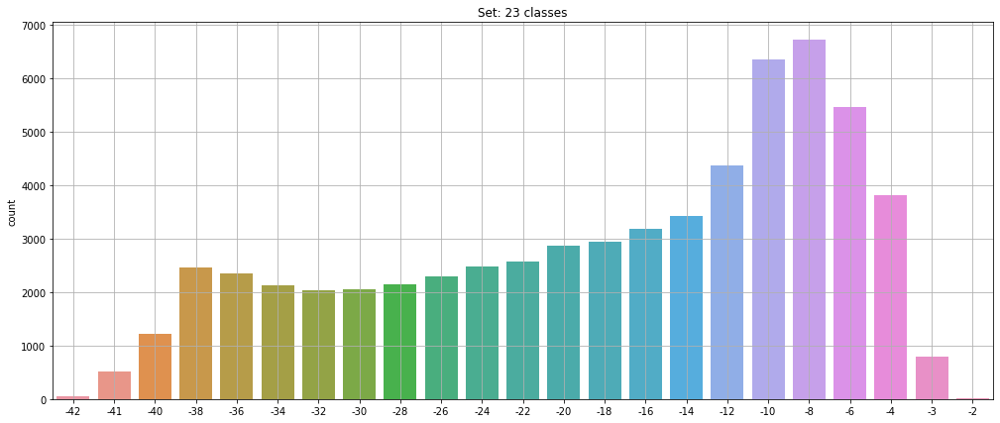

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
y = []
a = glob("cami/camarones_3//*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

63760


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


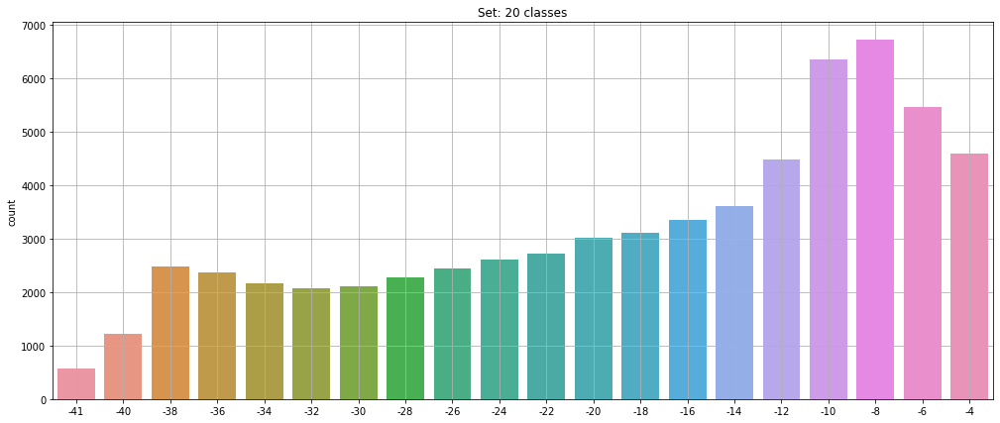

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
y = []
a = glob("cami/camarones_3//*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

63760


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


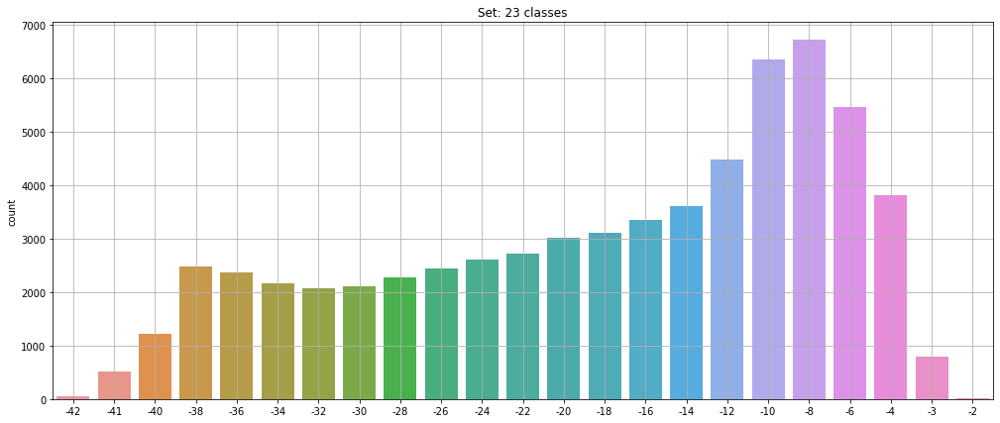

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
y = []
a = glob("cami/camarones_3//*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

63760


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


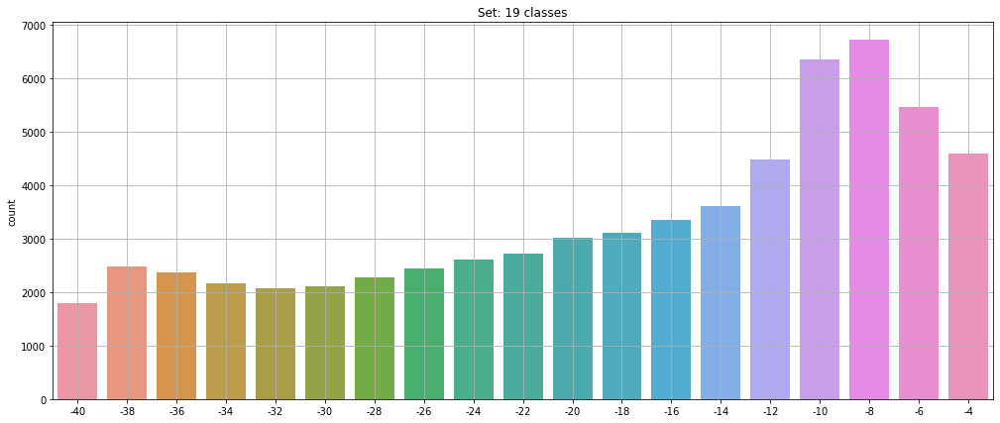

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
for i in glob("cami/camarones_3/*/*"):
    #print(i)
    #last = i.split("/")
    #dirr = int(last[-])
    kl = len(glob(i+"/*"))
    if kl==0:
        print(i, kl)
        shutil.rmtree(i)

cami/camarones_3/train/-17 0
cami/camarones_3/train/-15 0
cami/camarones_3/train/-27 0
cami/camarones_3/train/-25 0
cami/camarones_3/train/-13 0
cami/camarones_3/train/-23 0
cami/camarones_3/train/-29 0
cami/camarones_3/train/-19 0
cami/camarones_3/train/-31 0
cami/camarones_3/train/-21 0
cami/camarones_3/train/-35 0
cami/camarones_3/train/-33 0
cami/camarones_3/train/-11 0
cami/camarones_3/train/-37 0
cami/camarones_3/train/-39 0
cami/camarones_3/train/-3 0
cami/camarones_3/train/-41 0
cami/camarones_3/train/-42 0
cami/camarones_3/train/-2 0
cami/camarones_3/test/-33 0
cami/camarones_3/test/-31 0
cami/camarones_3/test/-27 0
cami/camarones_3/test/-19 0
cami/camarones_3/test/-23 0
cami/camarones_3/test/-13 0
cami/camarones_3/test/-15 0
cami/camarones_3/test/-21 0
cami/camarones_3/test/-25 0
cami/camarones_3/test/-17 0
cami/camarones_3/test/-29 0
cami/camarones_3/test/-11 0
cami/camarones_3/test/-37 0
cami/camarones_3/test/-35 0
cami/camarones_3/test/-39 0
cami/camarones_3/test/-3 0
cami

In [ ]:
list(range(-40, -3, 2))

[-40,
 -38,
 -36,
 -34,
 -32,
 -30,
 -28,
 -26,
 -24,
 -22,
 -20,
 -18,
 -16,
 -14,
 -12,
 -10,
 -8,
 -6,
 -4]

In [ ]:
src = "-3"
dst = "-4"
for i in glob("cami/camarones_3/*/{}/*".format(src)):
    #print(i)
    last = i.split("/")
    #dirr = int(last[-])
    print(i)
    paste = i.replace("/{}/".format(src), "/{}/".format(dst))
    shutil.move(i, paste)
    print(paste)
    print()

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_1880_2068.png
cami/camarones_3/train/-4/-3_bal_cam_20201224_120158_5_7_feed_1880_2068.png

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_4700_4888.png
cami/camarones_3/train/-4/-3_bal_cam_20201224_120158_5_7_feed_4700_4888.png

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_2820_3008.png
cami/camarones_3/train/-4/-3_bal_cam_20201224_120158_5_7_feed_2820_3008.png

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_3008_3196.png
cami/camarones_3/train/-4/-3_bal_cam_20201224_120158_5_7_feed_3008_3196.png

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_3384_3572.png
cami/camarones_3/train/-4/-3_bal_cam_20201224_120158_5_7_feed_3384_3572.png

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_2632_2820.png
cami/camarones_3/train/-4/-3_bal_cam_20201224_120158_5_7_feed_2632_2820.png

cami/camarones_3/train/-3/-3_bal_cam_20201224_120158_5_7_feed_3102_3290.png
cami/c

In [ ]:
y = []
a = glob("cami/camarones_3/*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

62276


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


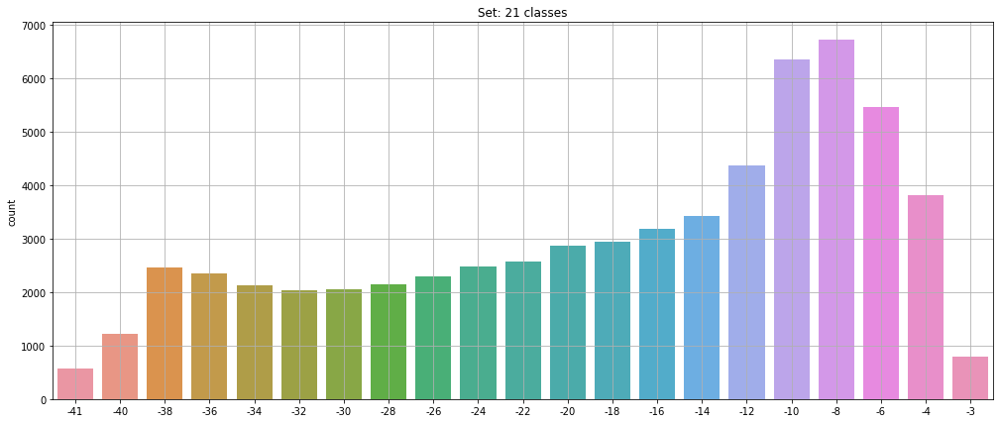

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
y = []
a = glob("cami/camarones_3/*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

62276


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


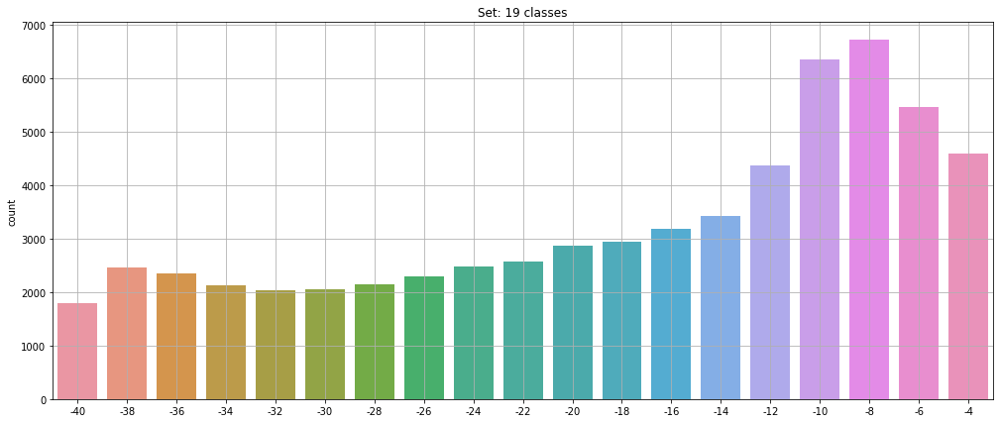

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
for i in glob("cami/camarones_3/*/*"):
    cant = len(glob(i+"/*"))
    print(i, cant)
    #if cant==0:
    #    shutil.rmtree(i)

cami/camarones_3/train/-20 2097
cami/camarones_3/train/-24 1839
cami/camarones_3/train/-14 2555
cami/camarones_3/train/-26 1736
cami/camarones_3/train/-28 1630
cami/camarones_3/train/-30 1561
cami/camarones_3/train/-12 3235
cami/camarones_3/train/-22 1937
cami/camarones_3/train/-32 1529
cami/camarones_3/train/-18 2212
cami/camarones_3/train/-34 1613
cami/camarones_3/train/-16 2384
cami/camarones_3/train/-36 1768
cami/camarones_3/train/-38 1838
cami/camarones_3/train/-8 5037
cami/camarones_3/train/-6 4087
cami/camarones_3/train/-4 3427
cami/camarones_3/train/-10 4778
cami/camarones_3/train/-40 1330
cami/camarones_3/test/-18 448
cami/camarones_3/test/-14 528
cami/camarones_3/test/-20 442
cami/camarones_3/test/-16 507
cami/camarones_3/test/-28 306
cami/camarones_3/test/-26 349
cami/camarones_3/test/-22 374
cami/camarones_3/test/-24 380
cami/camarones_3/test/-12 713
cami/camarones_3/test/-30 281
cami/camarones_3/test/-32 306
cami/camarones_3/test/-34 324
cami/camarones_3/test/-36 328
cami/

In [ ]:
y = []
a = glob("cami/camarones_3/*/*/*")
for i in a:
    part = i.split("/")
    nj = int(part[-2])
    y.append(nj)

62276


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


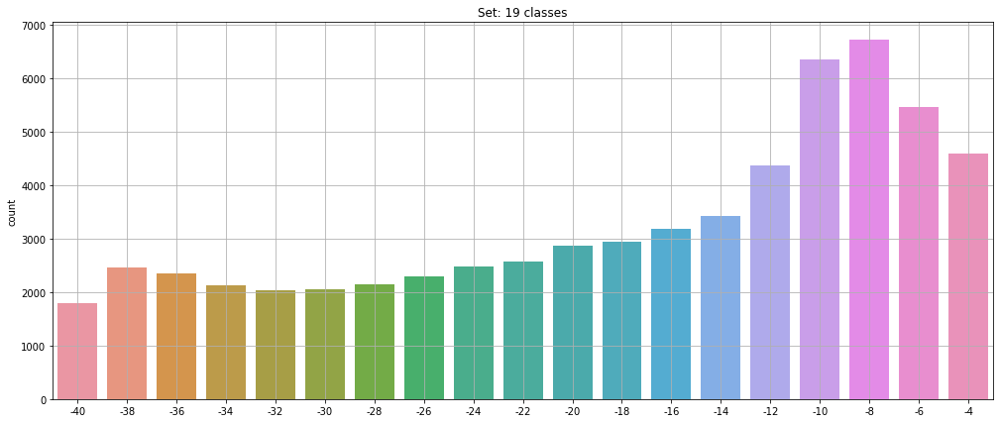

In [ ]:
print(len(y))
plt.figure(figsize=(17, 7))
sns.countplot(y)
plt.title("Set: {} classes".format(len(set(y))))
plt.grid()
plt.show()

In [ ]:
op = 0
for i in glob("cami/camarones_3/*/*"):
    print(i)
    op+=1

In [ ]:
op

57

In [ ]:
for k in glob(carpeta_test+"/*"):
    ll = len(glob(k+"/*"))
    #if ll!=0:
    #    shutil.rmtree(k)
    print(k, ll)

cami/camarones_3/test/-18 293
cami/camarones_3/test/-14 340
cami/camarones_3/test/-20 271
cami/camarones_3/test/-16 347
cami/camarones_3/test/-28 182
cami/camarones_3/test/-26 223
cami/camarones_3/test/-22 225
cami/camarones_3/test/-24 260
cami/camarones_3/test/-12 457
cami/camarones_3/test/-30 128
cami/camarones_3/test/-32 125
cami/camarones_3/test/-34 111
cami/camarones_3/test/-36 109
cami/camarones_3/test/-38 122
cami/camarones_3/test/-4 404
cami/camarones_3/test/-3 72
cami/camarones_3/test/-6 512
cami/camarones_3/test/-8 608
cami/camarones_3/test/-10 526
cami/camarones_3/test/-41 77
cami/camarones_3/test/-40 126
cami/camarones_3/test/-42 7


In [ ]:
for i in glob("cami/camarones_3/train/-2/*"):
    print(i)

In [ ]:
%cd drive/MyDrive/_main_/Camarones/Aufio_analyze/

/content/drive/MyDrive/_main_/Camarones/Aufio_analyze


In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
import keras
from keras import layers
from keras.layers import Activation, Dense, Dropout, Conv1D, Conv2D, Flatten, \
                         BatchNormalization, ZeroPadding2D, MaxPooling2D, \
                         GlobalMaxPooling2D, GlobalAveragePooling1D, \
                         AveragePooling2D, Input, Add
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras import regularizers
from keras.optimizers import SGD
import keras.backend as K
from keras.models import load_model
from keras.callbacks import EarlyStopping

In [ ]:
carpeta_train='cami/camarones_3/train'
carpeta_test='cami/camarones_3/test'
carpeta_valid='cami/camarones_3/valid'

In [ ]:
train_data = ImageDataGenerator(1./255)
test_data = ImageDataGenerator(1./255)
valid_data = ImageDataGenerator(1./255)

In [ ]:
train_generator = train_data.flow_from_directory(
    carpeta_train,
    target_size=(343, 188),
    class_mode='categorical',
    batch_size=32
)

Found 47330 images belonging to 19 classes.


In [ ]:
test_generator = test_data.flow_from_directory(
    carpeta_test,
    target_size=(343, 188), 
    class_mode="categorical",
    batch_size=32
)

Found 9692 images belonging to 19 classes.


In [ ]:
valid_generator = valid_data.flow_from_directory(
    carpeta_valid,
    target_size=(343, 188), 
    class_mode="categorical",
    batch_size=32
)

Found 6738 images belonging to 19 classes.


In [ ]:
model = Sequential()
model.add(Conv2D(64, (3, 3), activation='relu', input_shape=(343, 188, 3)))
#model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
#model.add(BatchNormalization())
model.add(MaxPooling2D(2, 1))
#model.add(Dropout(0.2))
model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
#model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3), activation='relu',))
#model.add(BatchNormalization())
model.add(MaxPooling2D((2, 1)))
#model.add(Dropout(0.3))
model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
#model.add(BatchNormalization())
model.add(Conv2D(256, (3, 3), activation='relu'))
#model.add(BatchNormalization())
model.add(MaxPooling2D((2, 1)))
# model.add(Dropout(0.4))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
# model.add(BatchNormalization())
# model.add(Dropout(0.5))
model.add(Dense(19, activation='softmax'))
# compile modelo
opt = SGD(lr=0.0001) #, momentum=0.9) # estabilidad de 10 epocas
# opt = SGD(lr=0.001, momentum=0.9) # lo mismo pero peor
# opt = tf.keras.optimizers.Adam(learning_rate=0.1) # estancado en la 3era
# opt = tf.keras.optimizers.Adam(learning_rate=0.001) # mejor rendimiento OJO
# opt = tf.keras.optimizers.RMSprop(learning_rate=0.1) # estancado
# opt = tf.keras.optimizers.RMSprop(learning_rate=0.001) # nope
# opt = tf.keras.optimizers.Nadam(learning_rate=0.0001)
model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 341, 186, 64)      1792      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 341, 186, 64)      36928     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 340, 185, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 340, 185, 128)     73856     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 338, 183, 128)     147584    
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 169, 183, 128)     0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 169, 183, 256)     2